# (23) MNIST—Gaus—1

**Motivation**: Fit MNIST, GaussianVAE. Device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

model_type = 'gaussian'

## CONV + FF

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST', model_type)

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'latent_act': None, 'fit_prior': False, 'n_ch': 32, 'n_latents': 10, 'enc_type': 'conv', 
'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True, 'weight_norm': False}

Trainer:
{'temp_anneal_portion': 0.0, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 1.0, 'lr': 0.002, 'epochs':
900, 'batch_size': 200, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 'grad_clip': 1000}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
| GaussianVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   5.1 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

gaussian_None_MNIST_z-10_k-32_<conv+b|conv+b>
mc_b200-ep900-lr(0.002)_beta(1:0x0.5)_gr(1000)_(2024_05_02,08:38)

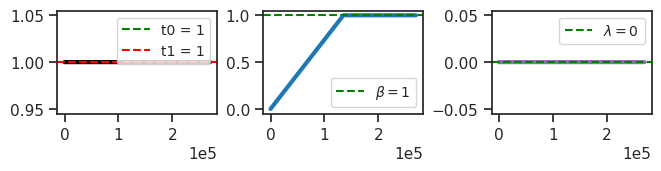

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [5]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([20]))

In [6]:
print(vae)

GaussianVAE(
  (mse): MSELoss()
  (stem): Conv2D(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=valid)
  (enc): Sequential(
    (0): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (1): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(32, 64, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (2): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (3): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(64, 128, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (4): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (5): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(128, 256, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=256, out_features=16, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=16, out_features=256, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (6): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
   

### Train

In [7]:
comment = f"eps{vae.enc[-3].eps}-warm2_{tr.cfg.name()}"
# comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 900, avg loss: 22.322511: 100%|█████████████████████████| 900/900 [2:30:44<00:00, 10.05s/it]


### Loss vld (freeze)

In [8]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 11.55763, 'kl': 13.1146965, 'kl_diag': 1.3114696, 'tot': 24.672325}

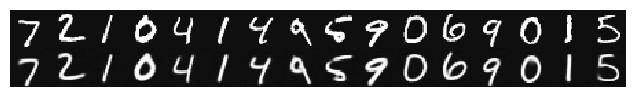

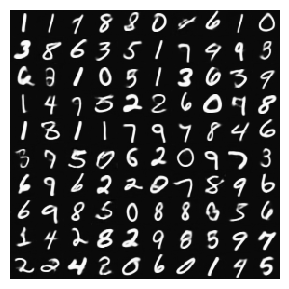

In [11]:
tr.show_recon(1.0), tr.show_samples(1.0);

### Identify dead neurons

In [12]:
dead_thres = 0.0
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [13]:
loss['kl_diag']

array([2.3306148 , 1.3845232 , 1.0567942 , 0.9168483 , 2.0519047 ,
       0.99710935, 0.7307086 , 1.6779056 , 1.2969408 , 0.6713467 ],
      dtype=float32)

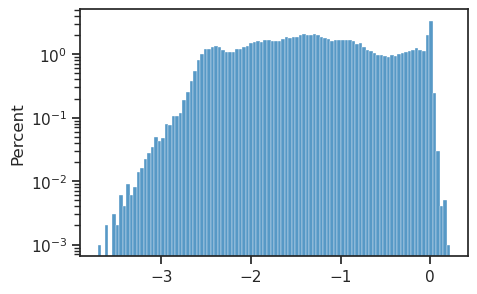

In [18]:
ax = sns.histplot(np.log(etc['sigma'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

In [20]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['mu'][:, i],
        f'z-{j}': etc['mu'][:, j],
        f'z-{i}_log': np.log(etc['sigma'][:, i]),
        f'z-{j}_log': np.log(etc['sigma'][:, j]),
        'lbl': tonp(tr.dl_vld.dataset.tensors[1]).astype(int),
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

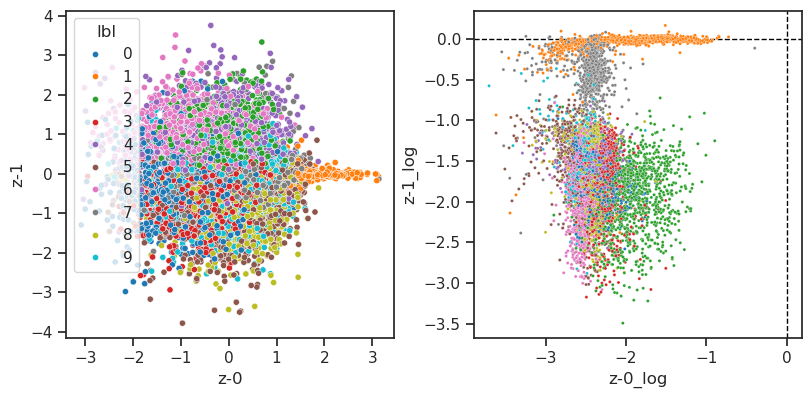

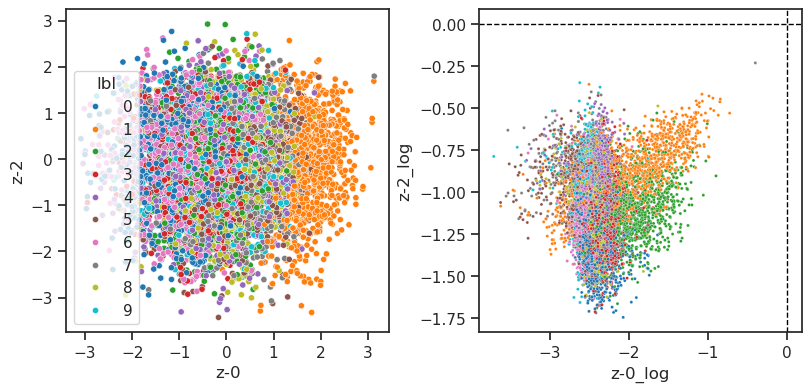

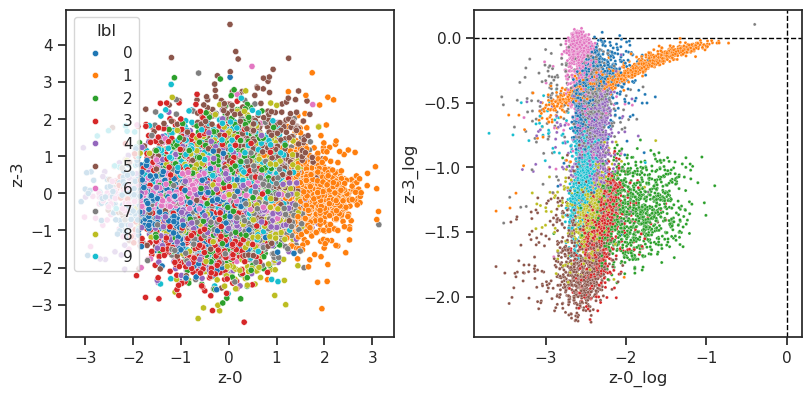

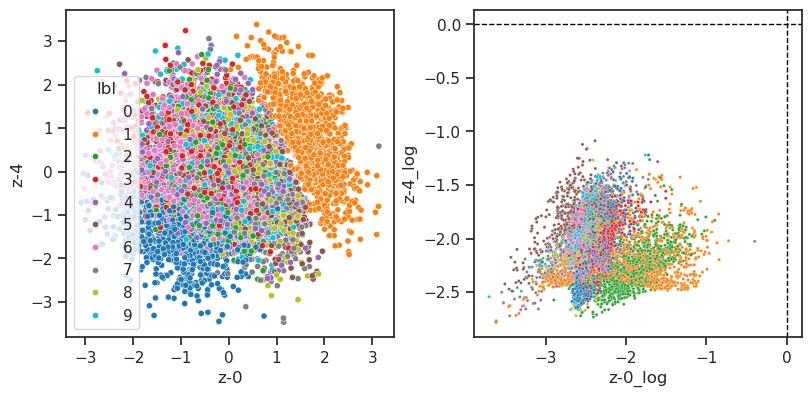

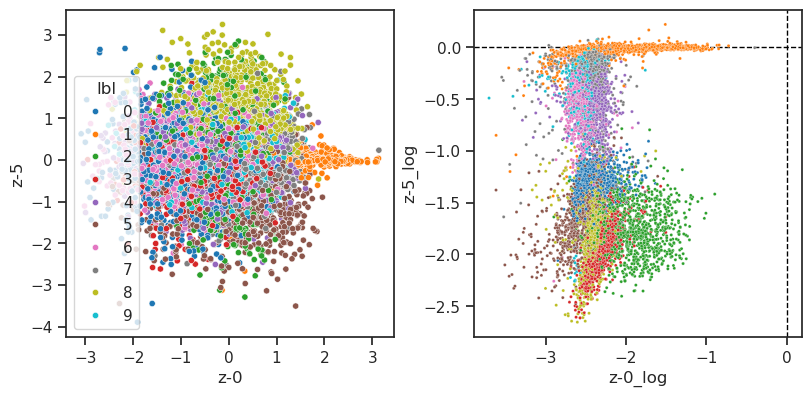

...

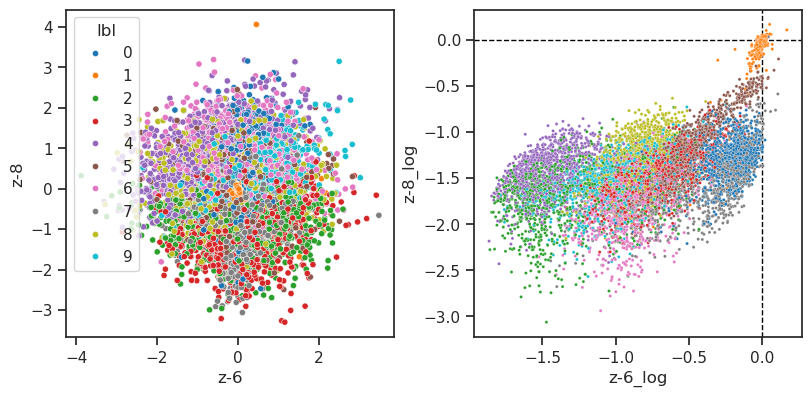

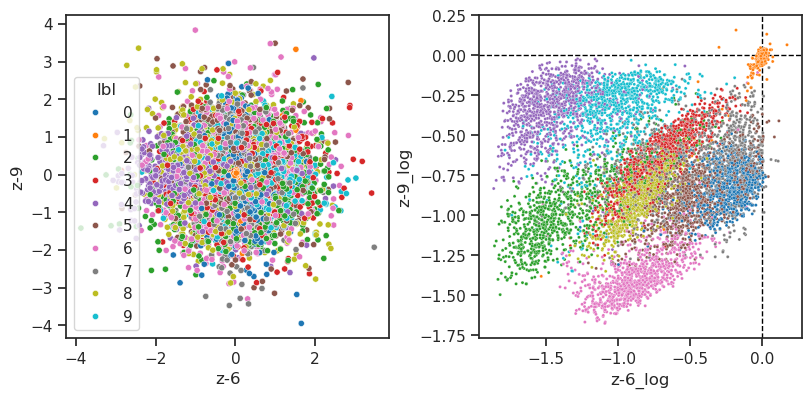

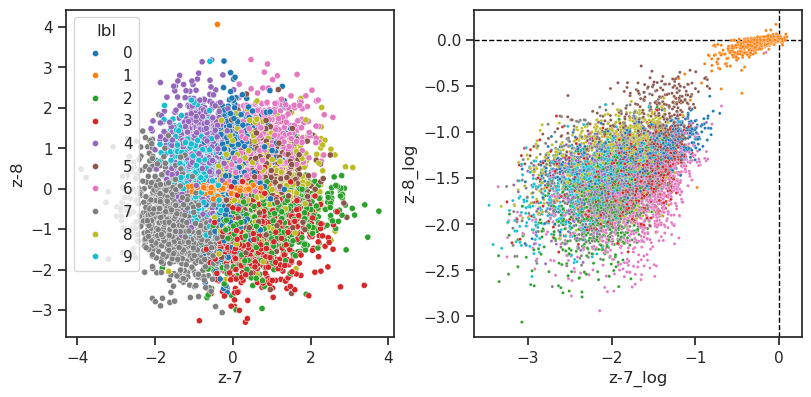

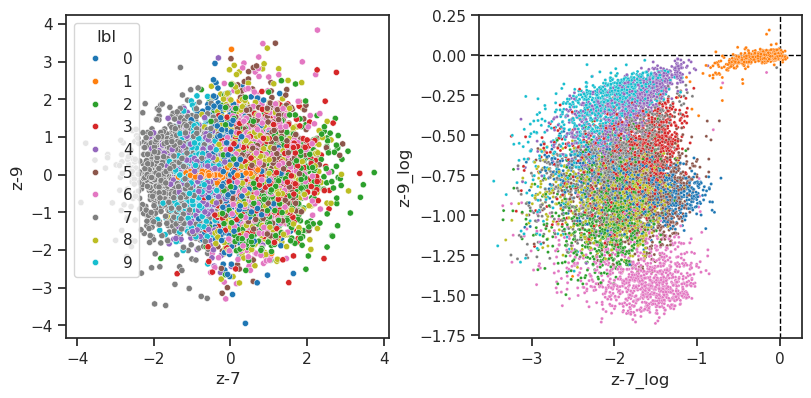

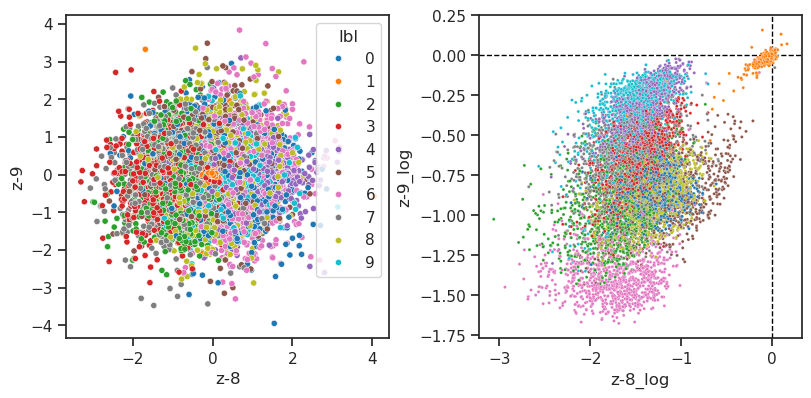

In [21]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

<Axes: ylabel='Count'>

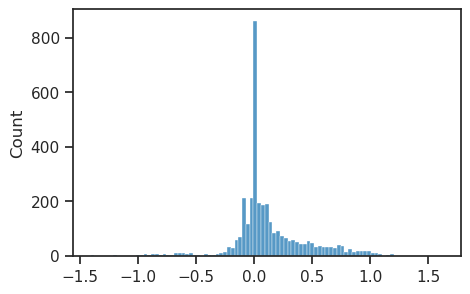

In [22]:
sns.histplot(tonp(torch.cat(vae.all_lognorm)))

In [23]:
(np.array(list(tr.stats['grad'].values())) > 500).sum() / len(tr.stats['grad']) * 100

0.06037037037037037

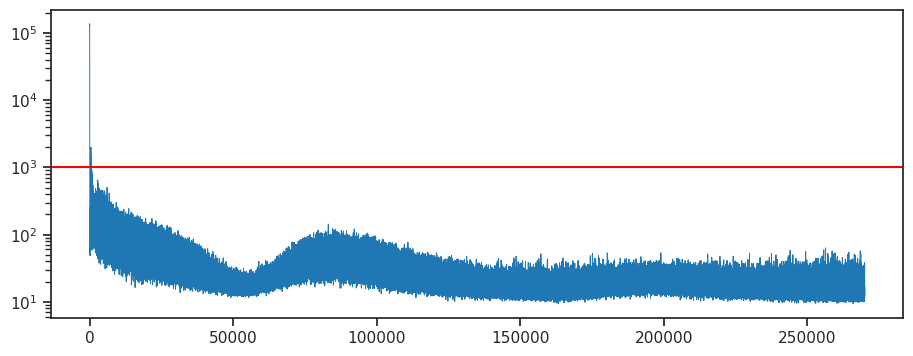

In [24]:
fig, ax = create_figure(1, 1, (11, 4))
plt.plot(tr.stats['grad'].keys(), tr.stats['grad'].values(), lw=0.7)
ax.axhline(tr.cfg.grad_clip, color='r')
ax.set(yscale='log')
plt.show()

In [25]:
df, df_summary = knn_analysis(
    x=etc['mu'],
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 5000, iter #0: 100%|█████████████████| 801/801 [01:59<00:00,  6.70it/s]


In [26]:
df_summary

,mean,std
size,,
20,0.315182,0.043436
50,0.483274,0.042725
100,0.592878,0.033607
200,0.691042,0.025079
500,0.773864,0.013135
1000,0.822932,0.009421
2000,0.861378,0.006352
4000,0.893750,0.003518
5000,0.903400,NaN


In [27]:
df, df_summary = knn_analysis(
    x=np.log(etc['sigma']),
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 5000, iter #0: 100%|█████████████████| 801/801 [01:36<00:00,  8.27it/s]


In [29]:
df_summary

,mean,std
size,,
20,0.426788,0.073556
50,0.705702,0.068000
100,0.832030,0.029442
200,0.891742,0.014071
500,0.921056,0.006596
1000,0.933196,0.004614
2000,0.940796,0.003021
4000,0.947150,0.001711
5000,0.948800,NaN


In [32]:
ftr = np.concatenate([
    etc['mu'],
    np.log(etc['sigma'])
], axis=1)
ftr.shape

(10000, 20)

In [33]:
df, df_summary = knn_analysis(
    x=ftr,
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 5000, iter #0: 100%|█████████████████| 801/801 [00:12<00:00, 61.71it/s]


In [34]:
df_summary

,mean,std
size,,
20,0.401018,0.059177
50,0.632622,0.051050
100,0.765334,0.035026
200,0.855822,0.016918
500,0.911164,0.008311
1000,0.936240,0.004828
2000,0.953070,0.003005
4000,0.963844,0.001670
5000,0.966000,NaN
